# Location Based Restaurant Recommendation System

# Installing packages

In [1]:
# Installing packages on systems like ubuntu.
!apt install gdal-bin python-gdal python3-gdal 

!apt install python3-rtree 
!pip install git+git://github.com/geopandas/geopandas.git

!pip install descartes 
!pip install folium 
!pip install plotly_express


Reading package lists... Done
Building dependency tree       
Reading state information... Done
gdal-bin is already the newest version (2.2.3+dfsg-2).
python-gdal is already the newest version (2.2.3+dfsg-2).
The following additional packages will be installed:
  python3-numpy
Suggested packages:
  python-numpy-doc python3-nose python3-numpy-dbg
The following NEW packages will be installed:
  python3-gdal python3-numpy
0 upgraded, 2 newly installed, 0 to remove and 37 not upgraded.
Need to get 2,288 kB of archives.
After this operation, 13.2 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python3-numpy amd64 1:1.13.3-2ubuntu1 [1,943 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 python3-gdal amd64 2.2.3+dfsg-2 [346 kB]
Fetched 2,288 kB in 1s (2,801 kB/s)
Selecting previously unselected package python3-numpy.
(Reading database ... 155222 files and directories currently installed.)
Preparing to unpack .../python3-numpy_

In [2]:
pip install geopandas

In [3]:
pip install dataprep

     |████████████████████████████████| 3.5 MB 25.2 MB/s 
     |████████████████████████████████| 943 kB 40.8 MB/s 
     |████████████████████████████████| 63 kB 2.7 MB/s 
     |████████████████████████████████| 719 kB 56.3 MB/s 
     |████████████████████████████████| 1.1 MB 71.9 MB/s 
     |████████████████████████████████| 1.5 MB 69.8 MB/s 
     |████████████████████████████████| 10.1 MB 43.7 MB/s 
     |████████████████████████████████| 848 kB 32.6 MB/s 
     |████████████████████████████████| 158 kB 65.9 MB/s 
     |████████████████████████████████| 366 kB 77.8 MB/s 
     |████████████████████████████████| 192 kB 56.8 MB/s 
     |████████████████████████████████| 160 kB 59.1 MB/s 
     |████████████████████████████████| 271 kB 50.8 MB/s 
     |████████████████████████████████| 132 kB 20.0 MB/s 
     |████████████████████████████████| 49 kB 6.1 MB/s 
     |████████████████████████████████| 1.5 MB 50.9 MB/s 
     |████████████████████████████████| 743 kB 42.6 MB/s 
  Created wheel f

## Import libraries

In [4]:
import pandas as pd 
import numpy as np
import geopandas as gpd

import matplotlib.pyplot as plt
import seaborn as sns

import folium

import plotly 
import plotly.offline as py
import plotly.graph_objs as go
import plotly_express as px

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.stats import chi2_contingency



In [5]:
from dataprep.datasets import get_dataset_names
from dataprep.datasets import load_dataset
from dataprep.eda import create_report,plot,plot_missing
import scipy.stats as stats

NumExpr defaulting to 2 threads.


# Laod Dataset

In [6]:
!wget https://www.dropbox.com/s/3x1w789mmuae3ao/yelp_academic_dataset_business.zip
!unzip yelp_academic_dataset_business.zip

--2021-11-29 07:04:31--  https://www.dropbox.com/s/3x1w789mmuae3ao/yelp_academic_dataset_business.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.6.18, 2620:100:601b:18::a27d:812
Connecting to www.dropbox.com (www.dropbox.com)|162.125.6.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/3x1w789mmuae3ao/yelp_academic_dataset_business.zip [following]
--2021-11-29 07:04:31--  https://www.dropbox.com/s/raw/3x1w789mmuae3ao/yelp_academic_dataset_business.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucd6e5d3cfcc5d2bc852ec870144.dl.dropboxusercontent.com/cd/0/inline/Ba6XBwhHUYb0x5Ze9G-ep7haFtVhgGqDFZ6jGvoOWa6qal2n5VQ30wYxk4iEEMbkijh1mw5bEaM8m3skJ4CcAUk4eGZ5udyHX5XY3rvucx4UjJ1tEBPQgrUMmT-Rh87ZQmZjs9gtdAwQKvPOVuSNaPxq/file# [following]
--2021-11-29 07:04:32--  https://ucd6e5d3cfcc5d2bc852ec870144.dl.dropboxusercontent.com/cd/0/inline/Ba6XBwhHUYb0x5Ze9G-ep7ha

In [7]:
df = pd.read_json('yelp_academic_dataset_business.json', lines=True)
df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,1SWheh84yJXfytovILXOAQ,Arizona Biltmore Golf Club,2818 E Camino Acequia Drive,Phoenix,AZ,85016,33.522143,-112.018481,3.0,5,0,{'GoodForKids': 'False'},"Golf, Active Life",None
1,QXAEGFB4oINsVuTFxEYKFQ,Emerald Chinese Restaurant,30 Eglinton Avenue W,Mississauga,ON,L5R 3E7,43.605499,-79.652289,2.5,128,1,"{'RestaurantsReservations': 'True', 'GoodForMe...","Specialty Food, Restaurants, Dim Sum, Imported...","{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W..."
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,1,"{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...","Sushi Bars, Restaurants, Japanese","{'Monday': '17:30-21:30', 'Wednesday': '17:30-..."
3,xvX2CttrVhyG2z1dFg_0xw,Farmers Insurance - Paul Lorenz,"15655 W Roosevelt St, Ste 237",Goodyear,AZ,85338,33.455613,-112.395596,5.0,3,1,None,"Insurance, Financial Services","{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ..."
4,HhyxOkGAM07SRYtlQ4wMFQ,Queen City Plumbing,"4209 Stuart Andrew Blvd, Ste F",Charlotte,NC,28217,35.190012,-80.887223,4.0,4,1,"{'BusinessAcceptsBitcoin': 'False', 'ByAppoint...","Plumbing, Shopping, Local Services, Home Servi...","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ..."


Shape of Dataset

In [8]:
df.shape

(192609, 14)

Information about Dataset

In [9]:
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192609 entries, 0 to 192608
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   business_id   192609 non-null  object 
 1   name          192609 non-null  object 
 2   address       192609 non-null  object 
 3   city          192609 non-null  object 
 4   state         192609 non-null  object 
 5   postal_code   192609 non-null  object 
 6   latitude      192609 non-null  float64
 7   longitude     192609 non-null  float64
 8   stars         192609 non-null  float64
 9   review_count  192609 non-null  int64  
 10  is_open       192609 non-null  int64  
 11  attributes    163773 non-null  object 
 12  categories    192127 non-null  object 
 13  hours         147779 non-null  object 
dtypes: float64(3), int64(2), object(9)
memory usage: 20.6+ MB


None

## Exploratory Data Analaysis (EDA)

In [10]:
#Overall Statistics

In [11]:
# function for overall statistical report
def overall_stat(df):
    # display the overall stat report
    display(plot(df, display=['Stats', 'Insights']))
    # display(df.info())

    # store and display the numerical and nonn-numerical cols in df
    num_cols=list(df.select_dtypes(include=['number']).columns)
    non_num_cols=list((set(df.columns)-set(num_cols)))

    print(f'Num cols = {num_cols}')
    print(f'Non-num cols = {non_num_cols}')


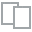
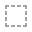
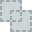
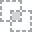
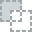
...
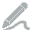
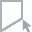
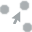
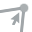
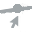

Num cols = ['latitude', 'longitude', 'stars', 'review_count', 'is_open']
Non-num cols = ['address', 'city', 'name', 'hours', 'business_id', 'state', 'postal_code', 'attributes', 'categories']


In [12]:
# display the overall stats
overall_stat(df)

In [13]:
df['Restaurants'] = df['categories'].str.contains('Restaurants')
df.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants
0,1SWheh84yJXfytovILXOAQ,Arizona Biltmore Golf Club,2818 E Camino Acequia Drive,Phoenix,AZ,85016,33.522143,-112.018481,3.0,5,0,{'GoodForKids': 'False'},"Golf, Active Life",None,False
1,QXAEGFB4oINsVuTFxEYKFQ,Emerald Chinese Restaurant,30 Eglinton Avenue W,Mississauga,ON,L5R 3E7,43.605499,-79.652289,2.5,128,1,"{'RestaurantsReservations': 'True', 'GoodForMe...","Specialty Food, Restaurants, Dim Sum, Imported...","{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",True


In [14]:
df_restaurants = df.loc[df.Restaurants == True]
df_restaurants.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants
1,QXAEGFB4oINsVuTFxEYKFQ,Emerald Chinese Restaurant,30 Eglinton Avenue W,Mississauga,ON,L5R 3E7,43.605499,-79.652289,2.5,128,1,"{'RestaurantsReservations': 'True', 'GoodForMe...","Specialty Food, Restaurants, Dim Sum, Imported...","{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",True
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,1,"{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...","Sushi Bars, Restaurants, Japanese","{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",True
11,1Dfx3zM-rW4n-31KeC8sJg,Taco Bell,2450 E Indian School Rd,Phoenix,AZ,85016,33.495194,-112.028588,3.0,18,1,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...","Restaurants, Breakfast & Brunch, Mexican, Taco...","{'Monday': '7:0-0:0', 'Tuesday': '7:0-0:0', 'W...",True
13,fweCYi8FmbJXHCqLnwuk8w,Marco's Pizza,5981 Andrews Rd,Mentor-on-the-Lake,OH,44060,41.708520,-81.359556,4.0,16,1,"{'RestaurantsPriceRange2': '2', 'BusinessAccep...","Italian, Restaurants, Pizza, Chicken Wings","{'Monday': '10:0-0:0', 'Tuesday': '10:0-0:0', ...",True
17,PZ-LZzSlhSe9utkQYU8pFg,Carluccio's Tivoli Gardens,"1775 E Tropicana Ave, Ste 29",Las Vegas,NV,89119,36.100016,-115.128529,4.0,40,0,"{'OutdoorSeating': 'False', 'BusinessAcceptsCr...","Restaurants, Italian",None,True


In [15]:
df_restaurants.shape

(59371, 15)

#Univariate **Analysis**

#Numerical Feature Univariate **Analysis**

In [16]:
# define the interest feature you want to explore
inter_features='review_count'

# define the function for univariate analysis
def num_uni_analysis(df,inter_features):
    display(plot(df,inter_features,display=['Stats','KDE Plot','Normal Q-Q Plot','Box Plot']))
    skewness=df[inter_features].skew()
    kurtosis=df[inter_features].kurtosis()
    print(f'-The Skewness = {skewness}')
    if abs(skewness)<1:
        print(f'The [{inter_features}] distribution is nearly normal')
    elif skewness>1:
        print(f'The [{inter_features}] distribution is right skewed ')
    else:
        print(f'The [{inter_features}] distribution is left skewed ')
    print(f'-The Kurtosis = {kurtosis}')


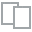
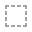
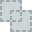
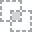
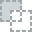
...
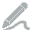
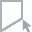
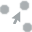
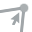
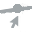

-The Skewness = 19.604081479417662
The [review_count] distribution is right skewed 
-The Kurtosis = 778.5035281793423


In [17]:

num_uni_analysis(df,inter_features)

In [18]:
#Categorical Feature Univaraite Analysis

#Categorical Feature Univaraite **Analysis**

In [19]:
# define the function for univariate analysis
def cat_uni_analysis(df,inter_features):
    print(f'The Non-Numerical Column You Choose is: [{inter_features}]\n')
    display(plot(df,inter_features,display=['Stats','Pie Chart','Value Table']))

The Non-Numerical Column You Choose is: [name]




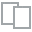
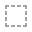
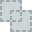
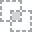
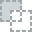
...
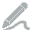
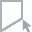
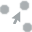
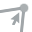
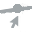

The Non-Numerical Column You Choose is: [address]




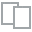
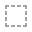
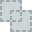
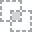
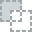
...
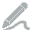
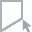
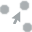
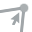
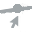

The Non-Numerical Column You Choose is: [city]




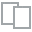
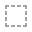
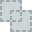
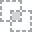
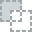
...
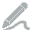
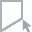
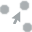
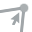
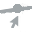

In [20]:
# display the univariate categorical analysis result
cat_uni_analysis(df,inter_features='name')
cat_uni_analysis(df,inter_features='address')
cat_uni_analysis(df,inter_features='city')

# Bivariate **Analysis**

## Overall num-num relationship (corr heatmap)

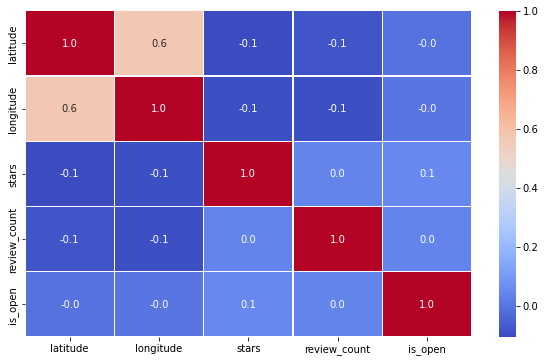

In [21]:
# overall num-num relationship: correlation heatmap
def heatmap(df,figsize):
    fig, axs=plt.subplots(figsize=figsize)
    sns.heatmap(df.corr(),annot=True, linewidths=.2,cmap='coolwarm',fmt='.1f',ax=axs)
    
# display the overall correlation heatmap
heatmap(df,figsize=(10,6))

# Categorical - Numerical relationship (1 vs 1)

In [22]:
pip install scikit-posthocs

     |████████████████████████████████| 43 kB 1.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for scikit-posthocs: filename=scikit_posthocs-0.6.7-py3-none-any.whl size=37902 sha256=fc48e9bcefa9d2e9ea207737b2cf6f3f3b9655f8e9ac5dc741abf55ca8f5b3d5
  Stored in directory: /root/.cache/pip/wheels/b8/21/e6/f39794d4a6ee3d3cc5146ca80b5cd949452ad4a8fde9f6b9fc
Successfully built scikit-posthocs


In [23]:
# this is for the Kruskal test used for categorical-numerical relationship
import scikit_posthocs as sp 

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [24]:
def cat_num_relationship(df,cat_col,num_col):
    # visualization
    print(f'[{cat_col}] --- [{num_col}] relationship')
    display(plot(df,num_col,cat_col))
    
    # hypothesis testing for catgorical-numerical relationship (Kruskal test)
    pc = sp.posthoc_conover(df, val_col=num_col, group_col=cat_col,p_adjust = 'holm')
    # visualization of the heatmap
    heatmap_args = {'linewidths': 0.45, 'linecolor': '0.5', 'square': True, 'cbar_ax_bbox': [0.80, 0.35, 0.04, 0.3]}

    # plot
    fig, ax = plt.subplots(ncols=1)
    fig.suptitle('Significance Plot')
    sp.sign_plot(pc,**heatmap_args,ax=ax) 
    fig.show()

[city] --- [latitude] relationship



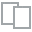
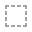
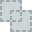
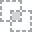
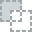
...
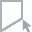
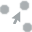
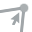
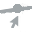

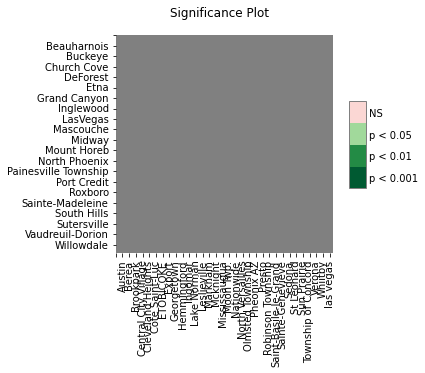

In [25]:
cat_num_relationship(df,
                    cat_col='city',
                    num_col='latitude')


In [26]:
from scipy.stats import chi2_contingency

**Categorical-Categorical Relationship (1 vs 1)**

In [27]:
# categoircal-categorical relationship

def cat_cat_relationship(df,cat_col_1,cat_col_2):
    # visualization
    plot(df,cat_col_1,
         cat_col_2,
         display=['Stacked Bar Chart','Heat Map'])
    
    # Chi-square test
    
    # 1st step convert the data into a contingency table with frequencies
    chi_contigency=pd.crosstab(df[cat_col_1],df[cat_col_2])
    print(f'Selected cols [{cat_col_1}] and [{cat_col_2}]')
    print('chi2-contingency table')
    display(chi_contigency)
    
    # 2nd step: Chi-square test of independence.
    c, p, dof, expected = chi2_contingency(chi_contigency)
    if p<0.05:
      print('Reject Null Hypothesis')
      print(f'The:\n [{cat_col_1}],[{cat_col_2}] are not independent\n')
    else:
      print('Fail to Reject Null Hypothesis')
      print(f'The:\n [{cat_col_1}],[{cat_col_2}] are independent\n') 
    print(f'The P-value = {p}')

In [28]:
# display the result
cat_cat_relationship(df,
                    cat_col_1='city',
                    cat_col_2='name')

Selected cols [city] and [name]
chi2-contingency table


name,L & A Insurance Services,"""T""s Hair Affair",# 1 Nails,# 1 Transmission Shop and Auto Repair,#1 Cochran Buick GMC of Monroeville,#1 Cochran Buick GMC of Robinson,#1 Cochran Cadillac - Monroeville,#1 Cochran Hyundai - Monroeville,#1 Cochran Hyundai of South Hills,#1 Cochran Kia - Robinson,#1 Cochran Mazda - Monroeville,#1 Cochran Mazda - North Hills,#1 Cochran Monroeville Collision Center,#1 Cochran Nissan - Pittsburgh,#1 Cochran Nissan Monroeville,#1 Cochran Subaru,#1 Cochran Volkswagen of South Hills,#1 Elite Nails,#1 Fried Rice,#1 Hawaiian Barbecue,#1 Nails,#1 Pho,#1 Sushi,#1Brothers Pizza,$10 Tickets,$100 Substance Abuse Evaluation,$2 Shoes,$2.50 Cleaners,$2.99 Cleaners,$39 Granite,$40 Backflow Test,$5 Dollar Food Festival,$59 Rooter & Plumbing Service,$99 Traffic Survival School,&Company Resto Bar,'1871' Berkeley Church,'ONO Poké Bar,'Round Table Tours,'Smashing' Cosmetica,'Turel,...,Échalote,École Privée,École de Conduite Morty's,École de Conduite Omega,École de Conduite Transit,École de danse swing Cat's Corner,École Élémentaire Pierre-Elliott-Trudeau,Ém Cafe,Énergie Cardio Complexe Desjardins,Épicerie Coréenne & Japonaise,Épicerie Mile-End,Épicerie Unique - Le Dépôt De La Biére,Épices Anatol,Épices de Cru,Érablière Charbonneau,Érablière à la Feuille d'Érable,État-Major,Étoile Rouge,Étoile des Indes,Événement Élite ELEKTRA,ÊAT - Être avec Toi,Île Flottante,ÎleSoniq,Ô Claf,Ô Deux Sœurs,Ô Liban,Ô Soeurs Volantes,Ô Thé,Ô Zeu,ÔBreton,Ômai Prêt-à-Manger,Ôzeu & O'Boeuf,Ûr Market & Eden's Juice Bar,Über Cafbar,Überrito,é by José Andrés,Œuf et Bœuf,Œufs & Cie,​Century Library,​Lounge Eighteen
city,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
110 Las Vegas,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
AGINCOURT,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
AVON,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
AZ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
toronto,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
verdun,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Île des Soeurs,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Fail to Reject Null Hypothesis
The:
 [city],[name] are independent

The P-value = 1.0


# check rating

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



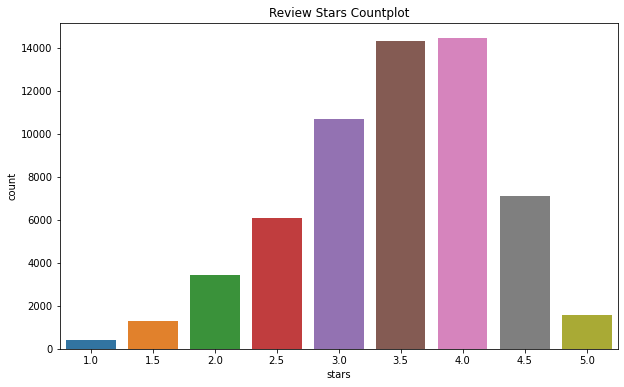

In [29]:

fig, ax = plt.subplots(figsize=(10,6))
sns.countplot(df_restaurants['stars'], ax=ax)
plt.title('Review Stars Countplot')
# plt.savefig('stars.png')
plt.show()

## Sort Dataset

In [30]:
top_restaurants = df_restaurants.sort_values(by=['review_count', 'stars'], ascending=False)[:20]
top_restaurants.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants
82250,4JNXUYY8wbaaDmk3BPzlWw,Mon Ami Gabi,3655 Las Vegas Blvd S,Las Vegas,NV,89109,36.112859,-115.172434,4.0,8348,1,"{'Corkage': 'True', 'RestaurantsDelivery': 'Fa...","Food, French, Breakfast & Brunch, Restaurants,...","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",True
89206,RESDUcs7fIiihp38-d6_6g,Bacchanal Buffet,3570 S Las Vegas Blvd,Las Vegas,NV,89109,36.116113,-115.176222,4.0,8339,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Buffets, Sandwiches, Food, Breakf...","{'Monday': '7:30-22:0', 'Tuesday': '7:30-22:0'...",True
35199,K7lWdNUhCbcnEvI0NhGewg,Wicked Spoon,3708 Las Vegas Blvd S,Las Vegas,NV,89109,36.109550,-115.176155,3.5,6708,1,"{'GoodForKids': 'True', 'RestaurantsPriceRange...","Buffets, Breakfast & Brunch, Restaurants","{'Monday': '8:0-21:0', 'Tuesday': '8:0-21:0', ...",True
58852,f4x1YBxkLrZg652xt2KR5g,Hash House A Go Go,3535 Las Vegas Blvd,Las Vegas,NV,89109,36.118181,-115.171580,4.0,5763,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Breakfast & Brunch, Food, Restaurants, America...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W...",True
141820,cYwJA2A6I12KNkm2rtXd5g,Gordon Ramsay BurGR,3667 Las Vegas Blvd S,Las Vegas,NV,89109,36.110724,-115.172169,4.0,5484,0,"{'RestaurantsGoodForGroups': 'True', 'Alcohol'...","Restaurants, Burgers, American (Traditional)","{'Monday': '11:0-0:0', 'Tuesday': '11:0-0:0', ...",True


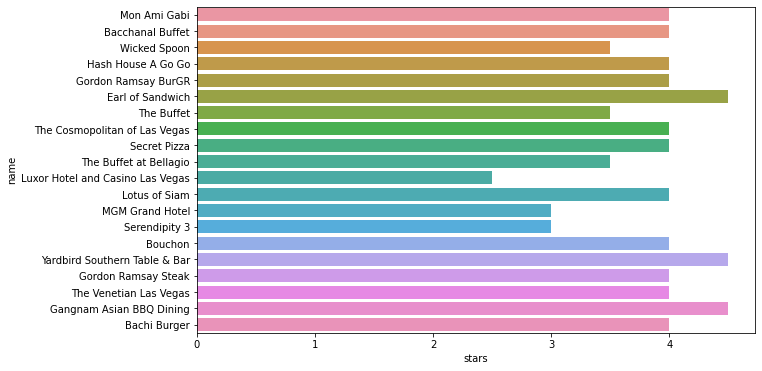

In [31]:
fig, ax = plt.subplots(figsize=(10,6))
sns.barplot(x = 'stars', y = 'name', data=top_restaurants, ax= ax);
plt.savefig('top20_restaurants.png')
plt.show()

In [32]:
px.set_mapbox_access_token("pk.eyJ1Ijoicml6d2FuMzY4MiIsImEiOiJja3ZwNDl5OXYxMTd5Mm9tb3dtYmdkNWRwIn0.9T3UzITkhgDAHmFTQXBQCQ")
#configure_plotly_browser_state()
px.scatter_mapbox(df_restaurants, lat="latitude", lon="longitude", color="stars", size='review_count' ,
                   size_max=30, zoom=3, width=1200, height=800)

In [33]:
lasVegas = df_restaurants[df_restaurants.state == 'NV']
px.scatter_mapbox(lasVegas, lat="latitude", lon="longitude", color="stars", size='review_count' ,
                   size_max=10, zoom=10, width=1200, height=500)

## Build and Train the model

## K-Means Clustering

### Determing the number of clusters (K)

Elbow Method

In [34]:
# Elbow method to determine the number of K in Kmeans Clustering
coords = lasVegas[['longitude','latitude']]

distortions = []
K = range(1,25)
for k in K:
    kmeansModel = KMeans(n_clusters=k)
    kmeansModel = kmeansModel.fit(coords)
    distortions.append(kmeansModel.inertia_)



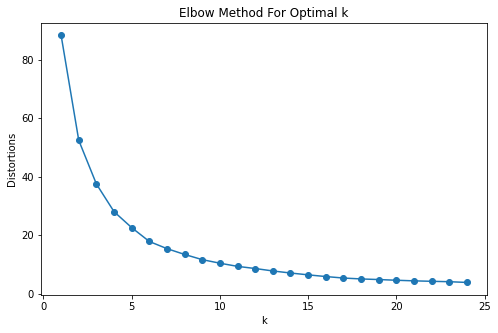

In [35]:
fig, ax = plt.subplots(figsize=(8, 5))
plt.plot(K, distortions, marker='o')
plt.xlabel('k')
plt.ylabel('Distortions')
plt.title('Elbow Method For Optimal k')
# plt.savefig('elbow.png')
plt.show()

Silhoute method


In [36]:
from sklearn.metrics import silhouette_score

sil = []
kmax = 50

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
  kmeans = KMeans(n_clusters = k).fit(coords)
  labels = kmeans.labels_
  sil.append(silhouette_score(coords, labels, metric = 'euclidean'))

In [37]:
sil

[0.38400973051084614,
 0.3668559840008646,
 0.3927147285150235,
 0.38605595241558727,
 0.4108950657969541,
 0.4174581273174104,
 0.4254695859376838,
 0.4047840081322176,
 0.40924605945669,
 0.40696905911007,
 0.42169278337246546,
 0.4315473188363802,
 0.4344289439082464,
 0.42843984657648365,
 0.43848438726058786,
 0.4241908048159175,
 0.4443661486707749,
 0.4474615659450325,
 0.4407236392880206,
 0.43167331621780564,
 0.43834251027456245,
 0.4413622100780547,
 0.4147176827464677,
 0.43103383231024106,
 0.439317496790533,
 0.4393417649094103,
 0.4285809293228609,
 0.4316730080774825,
 0.4285919084504005,
 0.44988440600971563,
 0.44309825289317484,
 0.43351738082737656,
 0.4263695719524844,
 0.42792084159681854,
 0.4416821052827136,
 0.437178974241476,
 0.4390225717199745,
 0.4395227462074379,
 0.4453435460282783,
 0.43672920431589035,
 0.43842372378084016,
 0.4447586437282799,
 0.44822117404674566,
 0.4529764617193175,
 0.44736752575747635,
 0.4516314296575283,
 0.46003601678481765,
 0

### K-Means Clustering

In [38]:
kmeans = KMeans(n_clusters=5, init='k-means++')
kmeans.fit(coords)
y = kmeans.labels_
print("k = 5", " silhouette_score ", silhouette_score(coords, y, metric='euclidean'))

k = 5  silhouette_score  0.386510035096676


In [39]:
lasVegas['cluster'] = kmeans.predict(lasVegas[['longitude','latitude']])
lasVegas.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants,cluster
17,PZ-LZzSlhSe9utkQYU8pFg,Carluccio's Tivoli Gardens,"1775 E Tropicana Ave, Ste 29",Las Vegas,NV,89119,36.100016,-115.128529,4.0,40,0,"{'OutdoorSeating': 'False', 'BusinessAcceptsCr...","Restaurants, Italian",None,True,2
25,tstimHoMcYbkSC4eBA1wEg,Maria's Mexican Restaurant & Bakery,6055 E Lake Mead Blvd,Las Vegas,NV,89156,36.195615,-115.040529,4.5,184,1,"{'BikeParking': 'True', 'BusinessParking': '{'...","Mexican, Restaurants, Patisserie/Cake Shop, Fo...","{'Monday': '11:0-21:0', 'Tuesday': '10:0-21:0'...",True,1
75,kANF0dbeoW34s2vwh6Umfw,Dairy Queen,6125 Spring Mountain Rd,Las Vegas,NV,89146,36.125031,-115.225620,2.0,33,0,"{'RestaurantsPriceRange2': '1', 'Ambience': '{...","Fast Food, Food, Restaurants, Ice Cream & Froz...",None,True,0
111,X8mtoSxY8whtmbDlj0D3Aw,Imperial Asian Buffet,4343 N Rancho Dr,Las Vegas,NV,89030,36.238596,-115.233331,2.0,4,1,None,"Restaurants, Chinese",None,True,3
135,bJP4l_BGq2CudEu0m-wNjg,Artisan Fine Dining Room,"Artisan Hotel, 1501 W Sahara Ave",Las Vegas,NV,89102,36.143672,-115.169792,2.0,3,0,"{'RestaurantsAttire': ''dressy'', 'Corkage': '...","Restaurants, Pizza, Italian, American (New)","{'Monday': '16:0-0:0', 'Tuesday': '16:0-0:0', ...",True,2


In [40]:
px.scatter_mapbox(lasVegas, lat="latitude", lon="longitude", color="cluster", size='review_count', 
                  hover_data= ['name', 'latitude', 'longitude'], zoom=10, width=1200, height=800)

## Location-Based Recommendation

In [41]:
top_restaurants_lasVegas = lasVegas.sort_values(by=['review_count', 'stars'], ascending=False)
top_restaurants_lasVegas.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants,cluster
82250,4JNXUYY8wbaaDmk3BPzlWw,Mon Ami Gabi,3655 Las Vegas Blvd S,Las Vegas,NV,89109,36.112859,-115.172434,4.0,8348,1,"{'Corkage': 'True', 'RestaurantsDelivery': 'Fa...","Food, French, Breakfast & Brunch, Restaurants,...","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",True,2
89206,RESDUcs7fIiihp38-d6_6g,Bacchanal Buffet,3570 S Las Vegas Blvd,Las Vegas,NV,89109,36.116113,-115.176222,4.0,8339,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Buffets, Sandwiches, Food, Breakf...","{'Monday': '7:30-22:0', 'Tuesday': '7:30-22:0'...",True,2
35199,K7lWdNUhCbcnEvI0NhGewg,Wicked Spoon,3708 Las Vegas Blvd S,Las Vegas,NV,89109,36.109550,-115.176155,3.5,6708,1,"{'GoodForKids': 'True', 'RestaurantsPriceRange...","Buffets, Breakfast & Brunch, Restaurants","{'Monday': '8:0-21:0', 'Tuesday': '8:0-21:0', ...",True,2
58852,f4x1YBxkLrZg652xt2KR5g,Hash House A Go Go,3535 Las Vegas Blvd,Las Vegas,NV,89109,36.118181,-115.171580,4.0,5763,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Breakfast & Brunch, Food, Restaurants, America...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W...",True,2
141820,cYwJA2A6I12KNkm2rtXd5g,Gordon Ramsay BurGR,3667 Las Vegas Blvd S,Las Vegas,NV,89109,36.110724,-115.172169,4.0,5484,0,"{'RestaurantsGoodForGroups': 'True', 'Alcohol'...","Restaurants, Burgers, American (Traditional)","{'Monday': '11:0-0:0', 'Tuesday': '11:0-0:0', ...",True,2


In [42]:
def recommend_restaurants(df, longitude, latitude):
    # Predict the cluster for longitude and latitude provided
    cluster = kmeans.predict(np.array([longitude,latitude]).reshape(1,-1))[0]
    print(cluster)
   
    # Get the best restaurant in this cluster
    return  df[df['cluster']==cluster].iloc[0:5][['name', 'latitude','longitude'	]]
   

In [43]:
recommend_restaurants(top_restaurants_lasVegas,-115.1891691,  36.1017316)

2


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



,name,latitude,longitude
82250,Mon Ami Gabi,36.112859,-115.172434
89206,Bacchanal Buffet,36.116113,-115.176222
35199,Wicked Spoon,36.109550,-115.176155
58852,Hash House A Go Go,36.118181,-115.171580
141820,Gordon Ramsay BurGR,36.110724,-115.172169


In [44]:
recommend_restaurants(top_restaurants_lasVegas,-115.2798544, 36.0842838) 

0


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



,name,latitude,longitude
131069,Hash House A Go Go,36.144713,-115.240092
130281,Mr Mamas,36.086287,-115.226134
116890,Echo & Rig,36.166576,-115.286232
42288,Red Rock Casino Resort & Spa,36.156413,-115.332847
11169,Juan's Flaming Fajitas & Cantina,36.100509,-115.302689


In [45]:
recommend_restaurants(top_restaurants_lasVegas, 	-115.082821, 36.155011 )

1


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



,name,latitude,longitude
111864,Lotus of Siam,36.143664,-115.141891
79764,Eat.,36.166900,-115.138977
127088,Pizza Rock,36.171618,-115.142267
55675,Carson Kitchen,36.167878,-115.140640
160676,Golden Nugget,36.169781,-115.145534


In [46]:
test_coordinates = {
    'user': [1, 2, 3], 
    'latitude' : [36.1017316, 36.0842838, 36.155011],
    'longitude' : [-115.1891691, -115.2798544, -115.082821],
}

test_df = pd.DataFrame(test_coordinates)
test_df

,user,latitude,longitude
0,1,36.101732,-115.189169
1,2,36.084284,-115.279854
2,3,36.155011,-115.082821


In [47]:
user1 = test_df[test_df['user'] == 1]
user1

,user,latitude,longitude
0,1,36.101732,-115.189169


In [48]:
fig = px.scatter_mapbox(recommend_restaurants(top_restaurants_lasVegas, user1.longitude, user1.latitude), lat="latitude", lon="longitude",  
                   zoom=10, width=1200, height=500, hover_data= ['name', 'latitude', 'longitude'])
fig.add_scattermapbox(lat=user1["latitude"], lon= user1["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



2


In [51]:
user2 = test_df[test_df['user'] == 2].reset_index()
fig = px.scatter_mapbox(recommend_restaurants(top_restaurants_lasVegas, user2.longitude, user2.latitude), lat="latitude", lon="longitude",  
                   zoom=10, width=1200, height=500, hover_data= ['name', 'latitude', 'longitude'])
fig.add_scattermapbox(lat=user2["latitude"], lon= user2["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



0


In [52]:
user3 = test_df[test_df['user'] == 3].reset_index()
fig = px.scatter_mapbox(recommend_restaurants(top_restaurants_lasVegas, user3.longitude, user3.latitude), lat="latitude", lon="longitude",  
                   zoom=10, width=1200, height=500, hover_data= ['name', 'latitude', 'longitude'])
fig.add_scattermapbox(lat=user3["latitude"], lon= user3["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



1
